#Detection of epileptic seizures in EEG examinations


##Objetives





## Description

###Libraries

In [ ]:
!pip install mne
!pip install PyWavelets
import pywt
import gdown
import subprocess
import os
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
import mne
import torch
from collections import Counter

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 19.3 MB/s eta 0:00:00


###DataSet

In [ ]:
def download_and_extract(file_url, zip_filename):
    #descargar data
    gdown.download(file_url, zip_filename, quiet=False)
    if not os.path.exists(zip_filename):
        print(f"Error: No se pudo descargar {zip_filename}")
        return
    #Descomprimir
    result = subprocess.run(['7z', 'x', zip_filename], capture_output=True, text=True)

    if result.returncode != 0:
        print(f"Error al descomprimir: {result.stderr}")
    else:
        print("Archivo descomprimido exitosamente")
    os.remove(zip_filename)

file_url = 'https://drive.google.com/uc?id=1X270adj4cp2-FlWUIwycwyTV5oMaIX8m'
zip_filename = 'EpilepticEEGDataset.zip'

download_and_extract(file_url, zip_filename)

Downloading...
From (original): https://drive.google.com/uc?id=1X270adj4cp2-FlWUIwycwyTV5oMaIX8m
From (redirected): https://drive.google.com/uc?id=1X270adj4cp2-FlWUIwycwyTV5oMaIX8m&confirm=t&uuid=17d2c9c7-3e4d-4bfe-b3cd-6a48897b2a95
To: /content/EpilepticEEGDataset.zip
100%|██████████| 3.29G/3.29G [00:54<00:00, 59.8MB/s]


Archivo descomprimido exitosamente


In [ ]:
x_train = np.load("./Npy_files/x_train.npy")
x_test = np.load("./Npy_files/x_test.npy")
y_train = np.load("./Npy_files/y_train.npy")
y_test = np.load("./Npy_files/y_test.npy")

Understanding the data

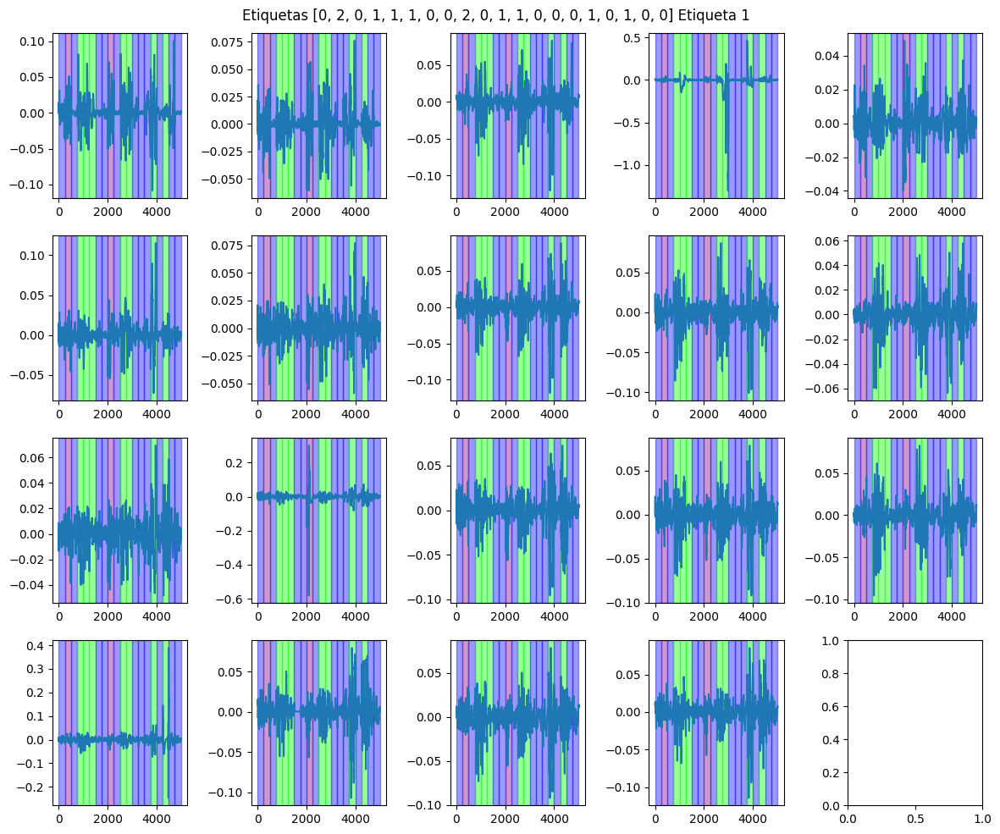

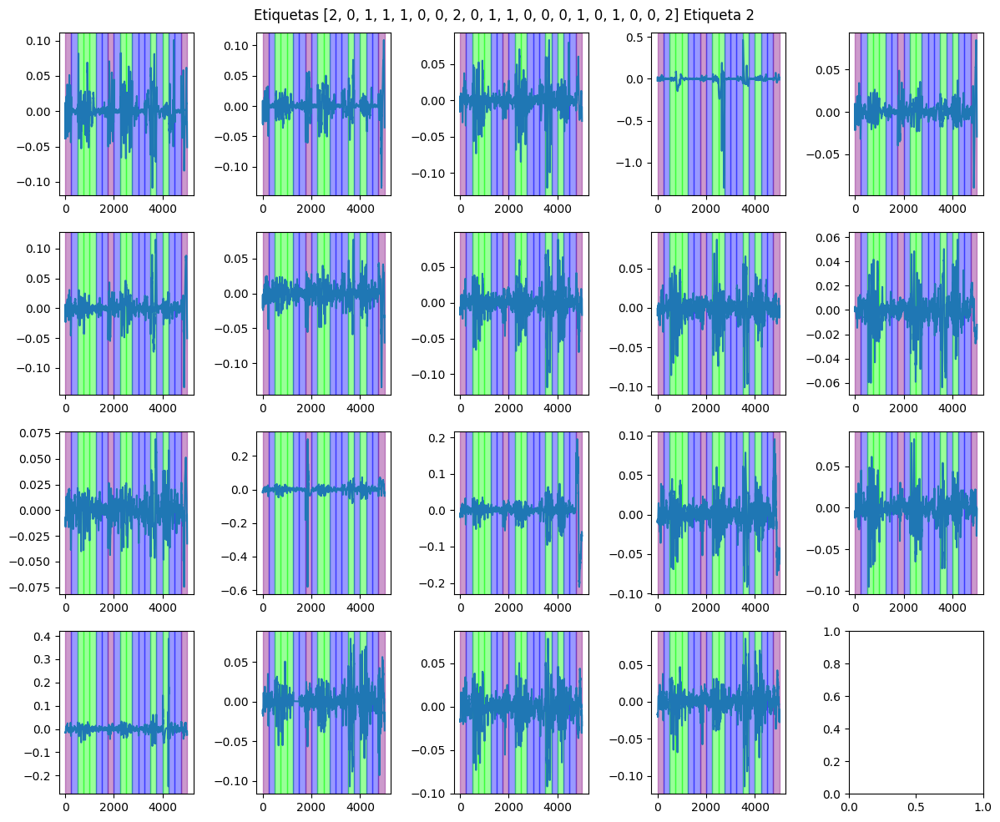

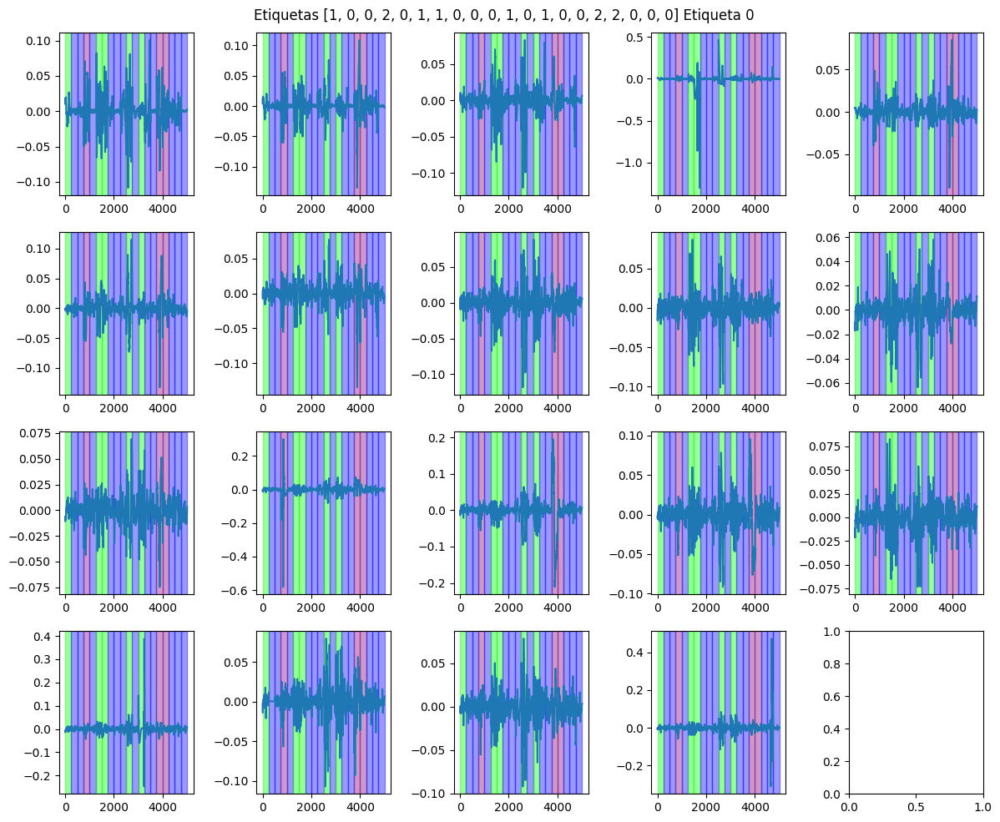

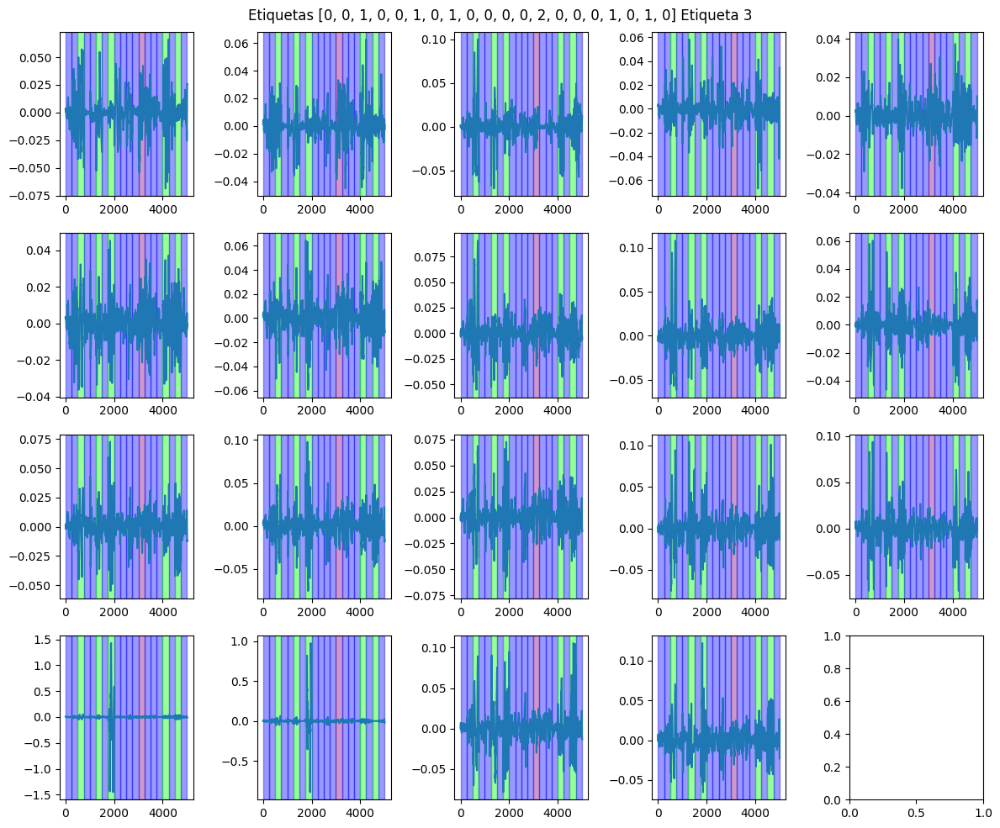

In [ ]:
from scipy.signal import welch, find_peaks
encontradas=[]
for i, signal in enumerate(y_train[100:]):
  fs=500
  if signal not in encontradas:
    encontradas.append(signal)
    canales = [list(x) for x in x_train[i - 10]]
    etiqueta=[]
    etiqueta.append(y_train[i - 10])
    for pos in range(-9,10,1):
      registro =  x_train[i+pos]
      etiqueta.append(y_train[i+pos])
      for posi,info in enumerate(registro):
        canales[posi].extend(info)



    fig, axs = plt.subplots(4, 5, figsize=(12, 10))
    plt.suptitle(f'Etiquetas {etiqueta} Etiqueta {signal}')
    colores = ['#0000FF', '#00FF00', '#800080', '#00FFFF']

    for j,canal in enumerate(canales):
      row = j // 5
      col = j % 5
      features = {}



      coeffs = pywt.dwt(canal, 'db10')
      cA, cD = coeffs#
      graficas=cA
      seccion_size = len(graficas)//20

      axs[row, col].plot(graficas)
      for idx, label in enumerate(etiqueta):
        start = idx * seccion_size
        end = start + seccion_size
        color = colores[label % len(colores)]
        axs[row, col].axvspan(start, end, color=color, alpha=0.4)

    plt.tight_layout()
    filename = f"GraficaAnalisis.webp"
    plt.savefig(filename, format='webp',dpi=300, bbox_inches='tight')
    plt.show()


preprocessing for model training

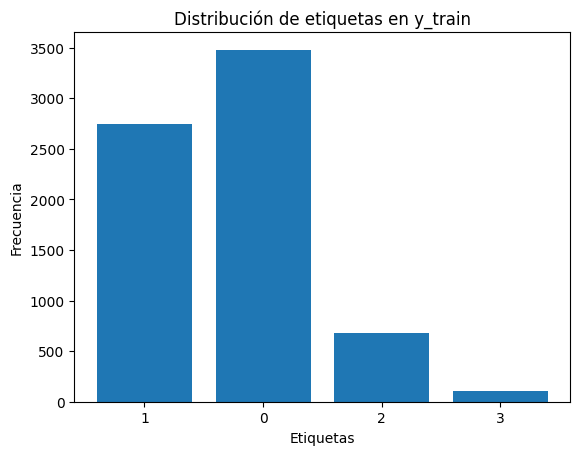

In [ ]:
# balanceop categorias grafica
plt.figure()
plt.bar(range(len(Counter(y_train))), list(Counter(y_train).values()))
plt.xticks(range(len(Counter(y_train))), list(Counter(y_train).keys()))
plt.xlabel('Etiquetas')
plt.ylabel('Frecuencia')
plt.title('Distribución de etiquetas en y_train')
plt.show()

In [ ]:
print("Balance de etiquetas en y_train:", Counter(y_train))
print("Balance de etiquetas en y_test:", Counter(y_test))

mask_train = (y_train == 0) | (y_train == 1)
mask_test = (y_test == 0) | (y_test == 1)

x_train= x_train[mask_train]
y_train = y_train[mask_train]

x_test = x_test[mask_test]
y_test = y_test[mask_test]

print("Balance de etiquetas en y_train filtrado:", Counter(y_train))
print("Balance de etiquetas en y_test filtrado:", Counter(y_test))

Balance de etiquetas en y_train: Counter({0: 3479, 1: 2745, 2: 682, 3: 105})
Balance de etiquetas en y_test: Counter({0: 416, 1: 289, 2: 68, 3: 6})
Balance de etiquetas en y_train filtrado: Counter({0: 3479, 1: 2745})
Balance de etiquetas en y_test filtrado: Counter({0: 416, 1: 289})


In [ ]:
preproceso=[]

for i in x_train:
  canal=[]
  for j in i:

    coeffs = pywt.dwt(j, 'db10')
    cA, cD = coeffs
    canal.append(cA)
  preproceso.append(canal)
x_train=np.array(preproceso)

preproceso=[]
for i in x_test:
  canal=[]
  for j in i:

    coeffs = pywt.dwt(j, 'db10')
    cA, cD = coeffs
    canal.append(cA)
  preproceso.append(canal)
x_test=np.array(preproceso)

Training Model

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import classification_report
x_train = torch.tensor(x_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.long)
x_test = torch.tensor(x_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.long)

x_train = x_train.unsqueeze(1)
x_test = x_test.unsqueeze(1)


batch_size = 32
train_dataset = TensorDataset(x_train, y_train)
test_dataset = TensorDataset(x_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)# CNN

class EEG_CNN(nn.Module):
    def __init__(self, num_classes=4):
        super(EEG_CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=(3, 5), padding=(1, 2))
        self.conv2 = nn.Conv2d(32, 64, kernel_size=(3, 5), padding=(1, 2))
        self.conv3 = nn.Conv2d(64, 128, kernel_size=(3, 5), padding=(1, 2))
        self.pool = nn.MaxPool2d(kernel_size=(2, 2))

        self.flatten_size = 128 * 2 * 62
        self.fc1 = nn.Linear(self.flatten_size, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        x = torch.flatten(x, start_dim=1)
        #x = F.relu(self.fc1(x))
        #x = self.fc2(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = EEG_CNN(num_classes=4).to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 2
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Época {epoch+1}/{num_epochs}, Pérdida: {running_loss/len(train_loader):.4f}")

model.eval()
all_predictions = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

print(classification_report(all_labels, all_predictions, target_names=["No Epilepsia", "Epilepsia"]))


Época 1/2, Pérdida: 2.3538
Época 2/2, Pérdida: 0.5953
              precision    recall  f1-score   support

No Epilepsia       0.69      0.95      0.80       416
   Epilepsia       0.85      0.40      0.54       289

    accuracy                           0.72       705
   macro avg       0.77      0.67      0.67       705
weighted avg       0.76      0.72      0.70       705



Export model

In [ ]:
torch.save(model, "modelo_EEG.pth")
print("Modelo guardado ")

Modelo guardado 


Final Funtion

Extracting EDF parameters from /content/Raw_EDF_Files/p10_Record1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 5401499  =      0.000 ... 10802.998 secs...
5401500


<ipython-input-83-1bf0d1d7af33>:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  modelo_cargado = torch.load("./modelo_EEG.pth")#path del modelo
<ipython-input-83-1bf0d1d7a

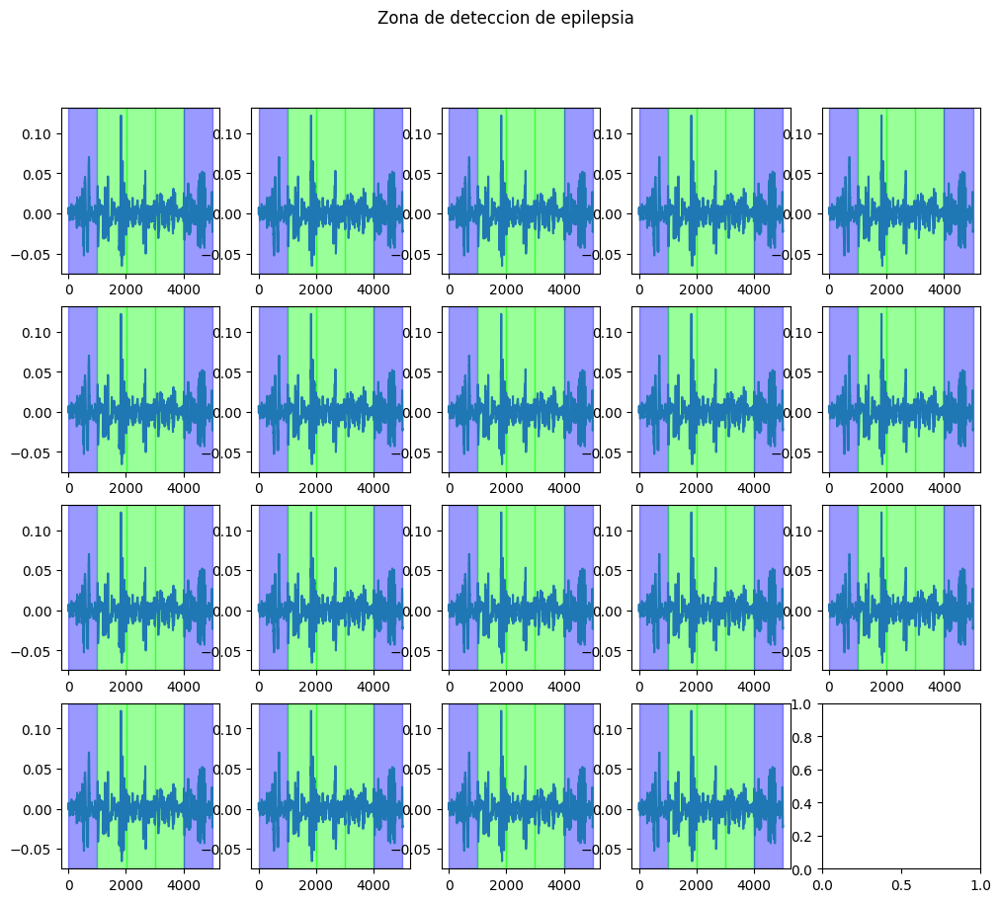

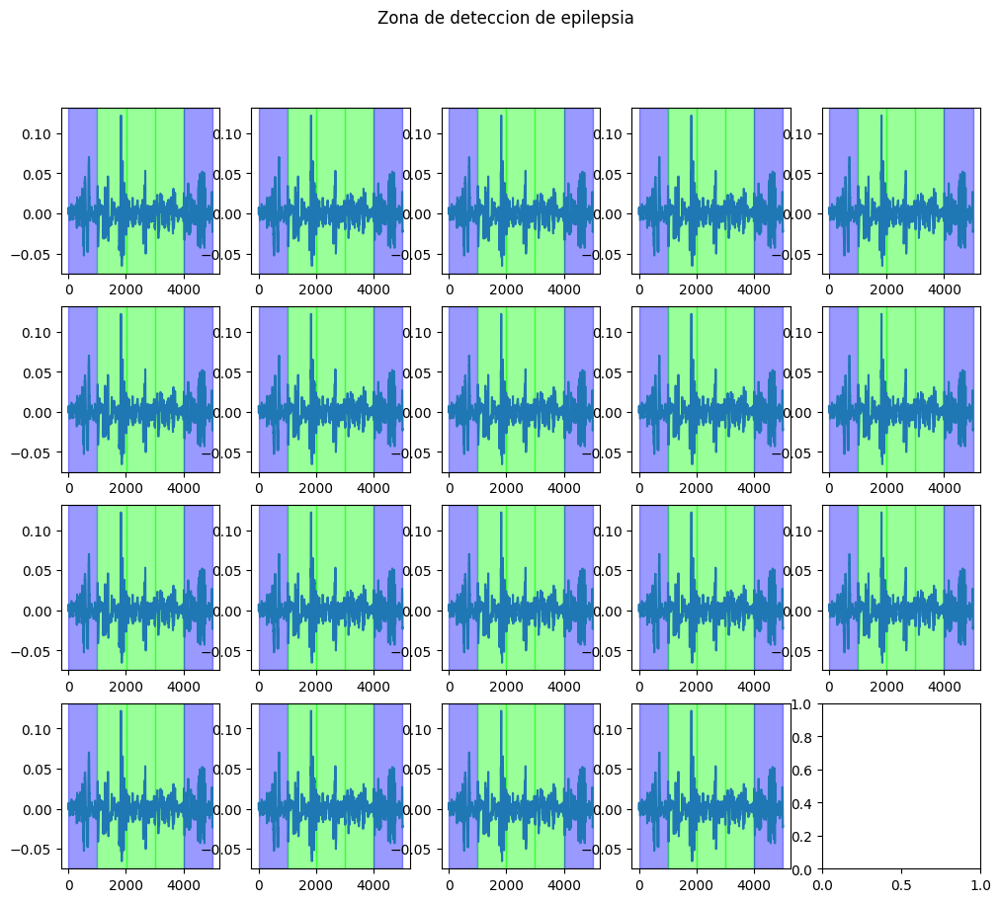

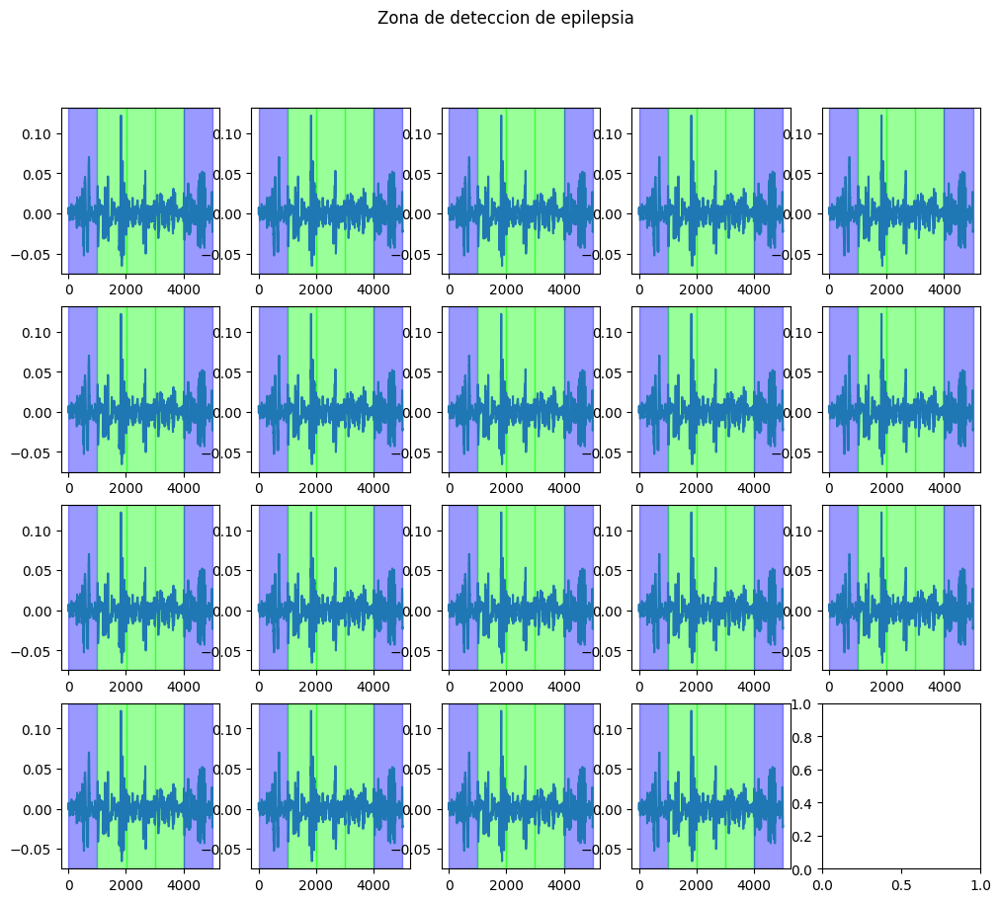

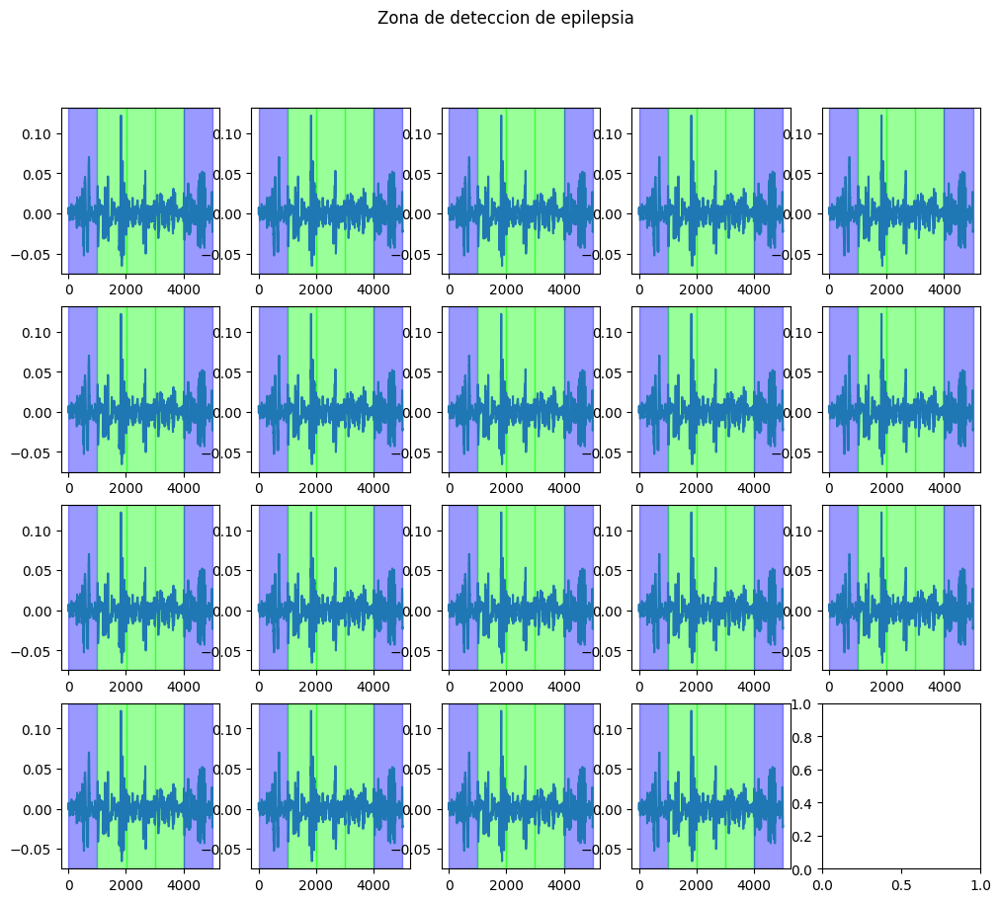

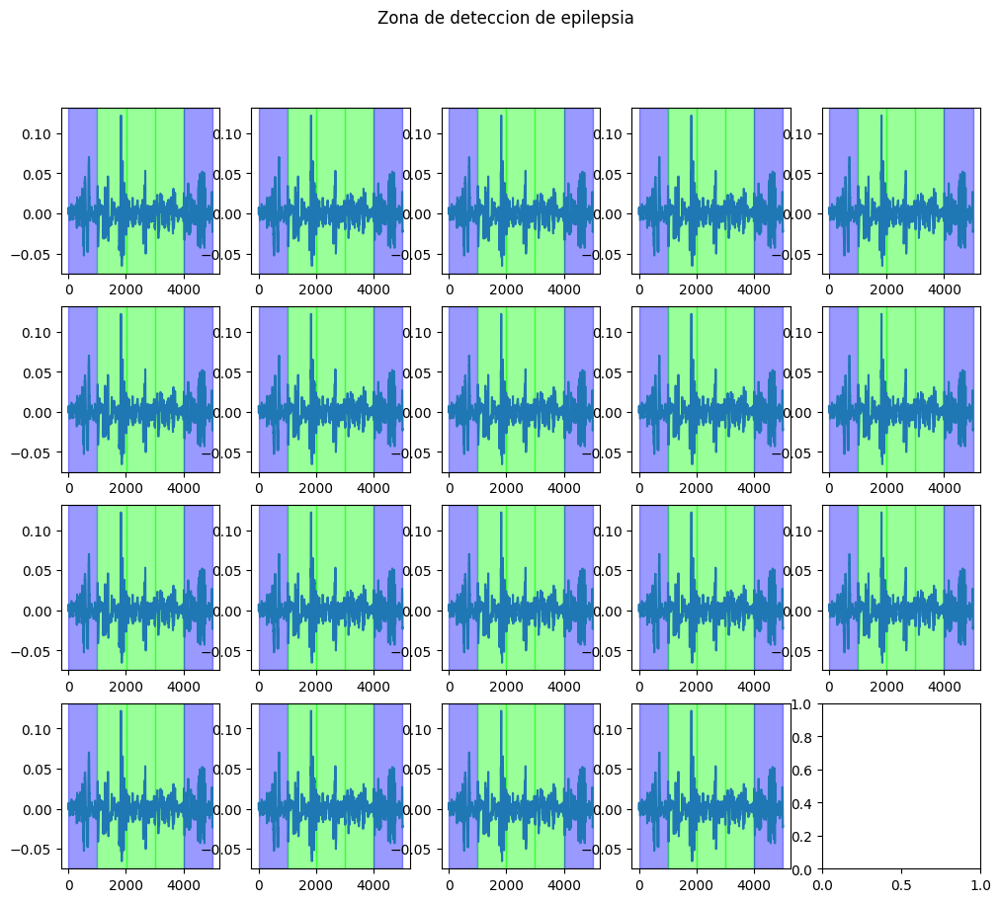

...

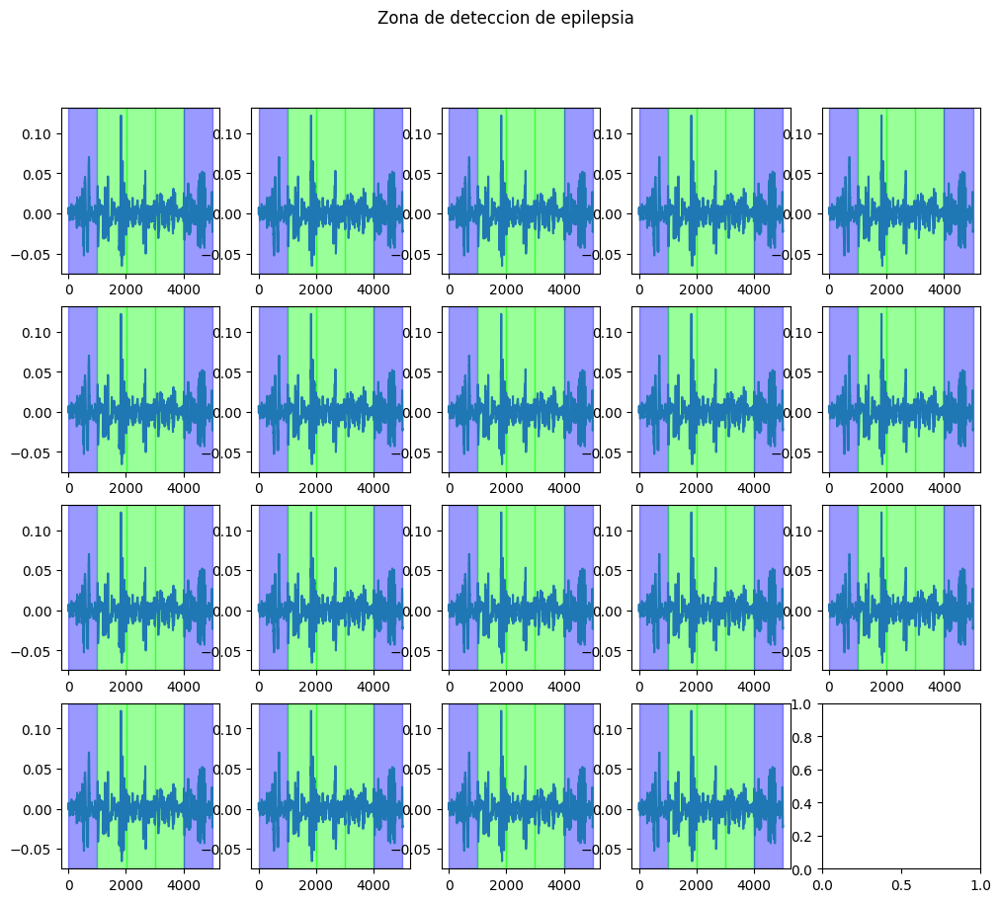

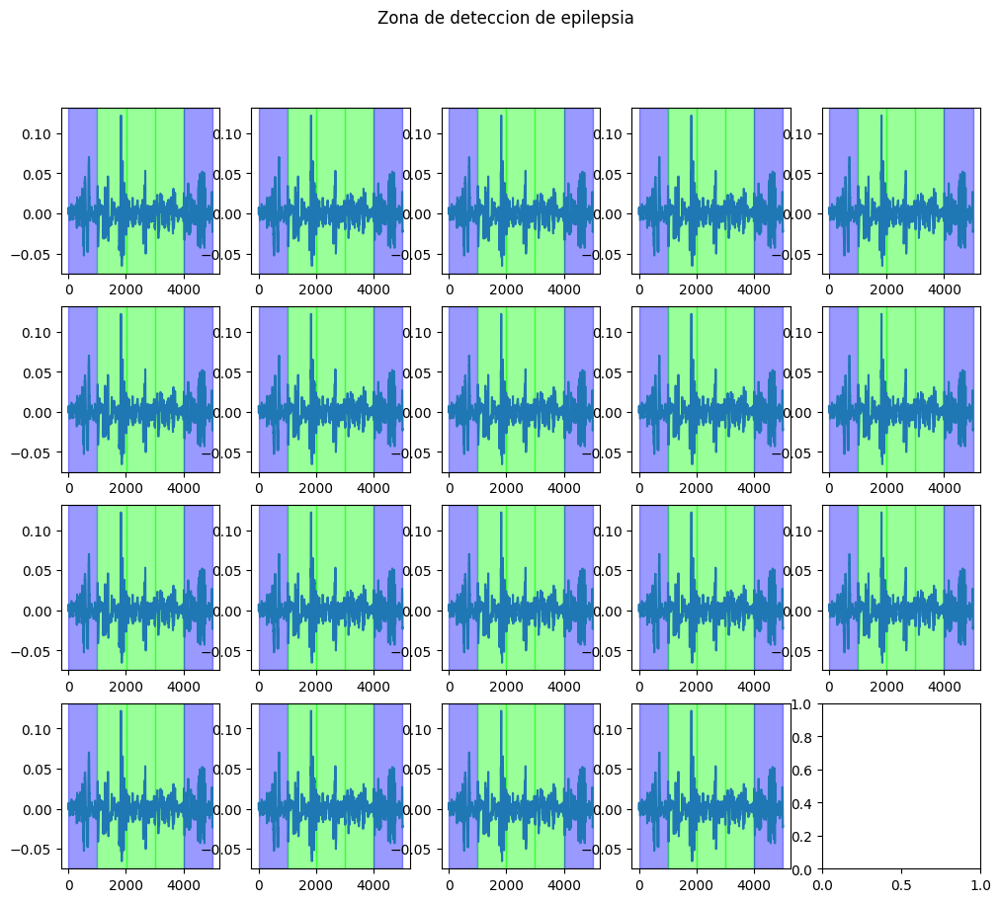

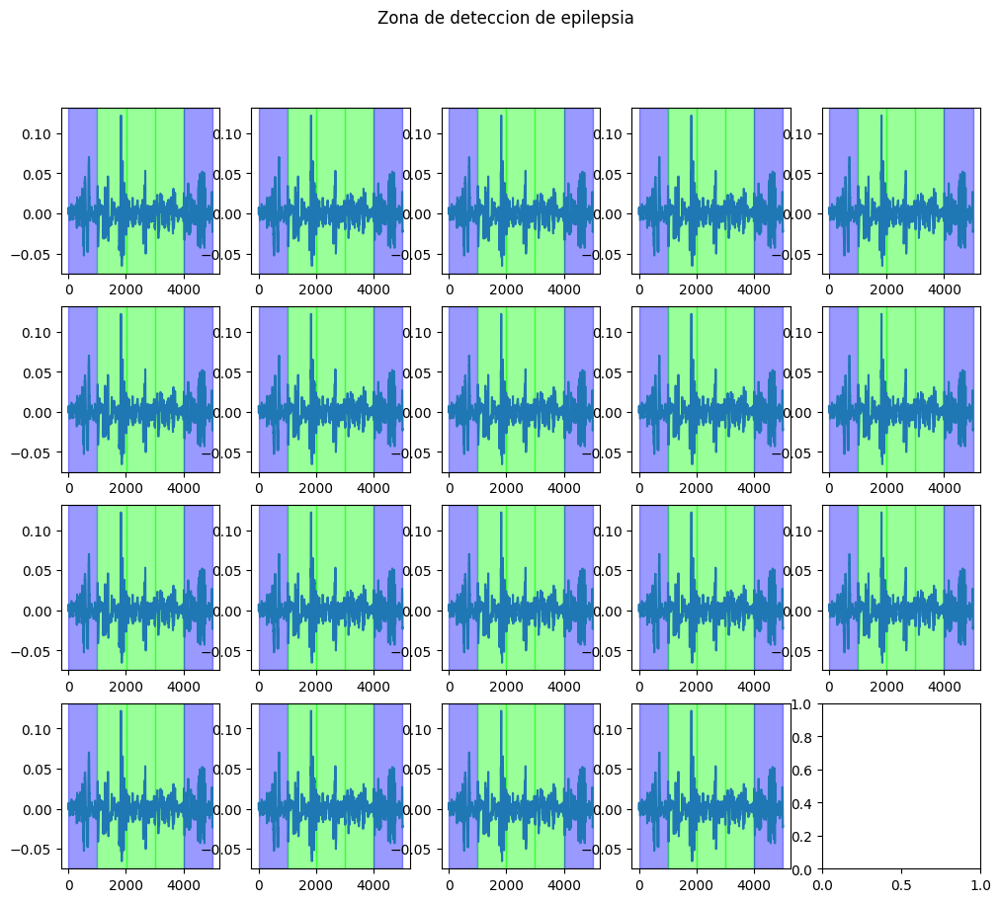

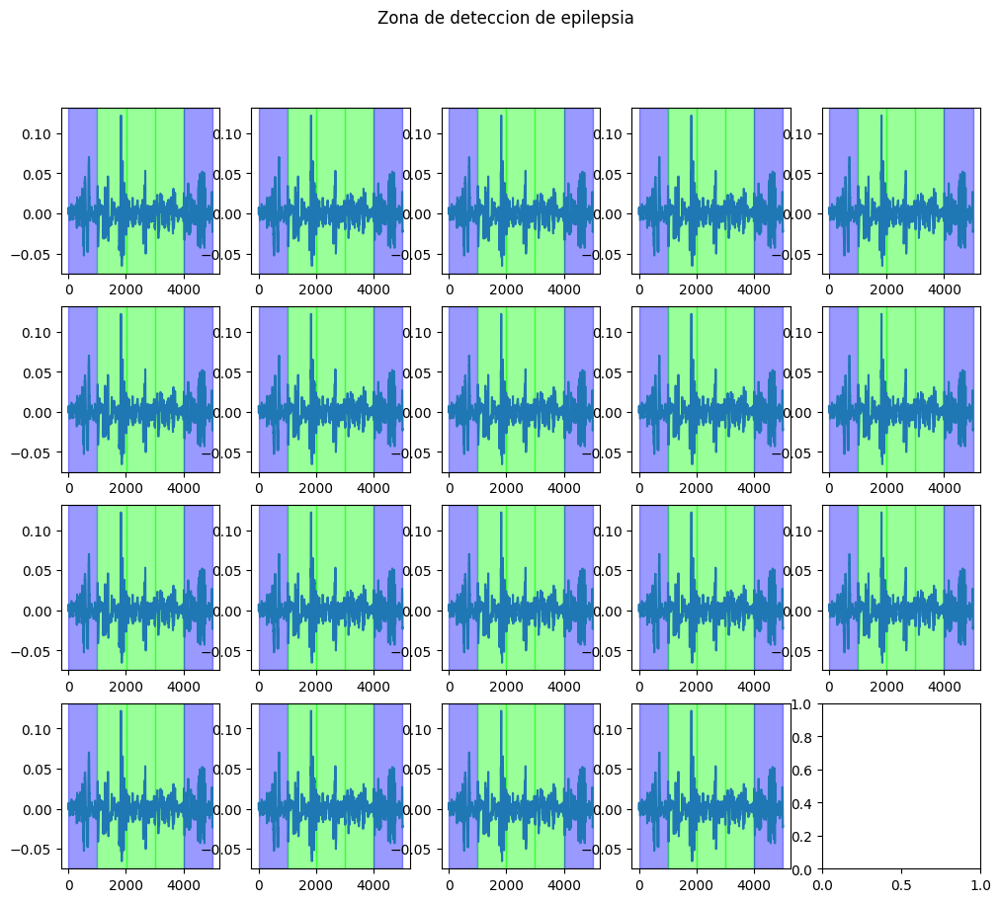

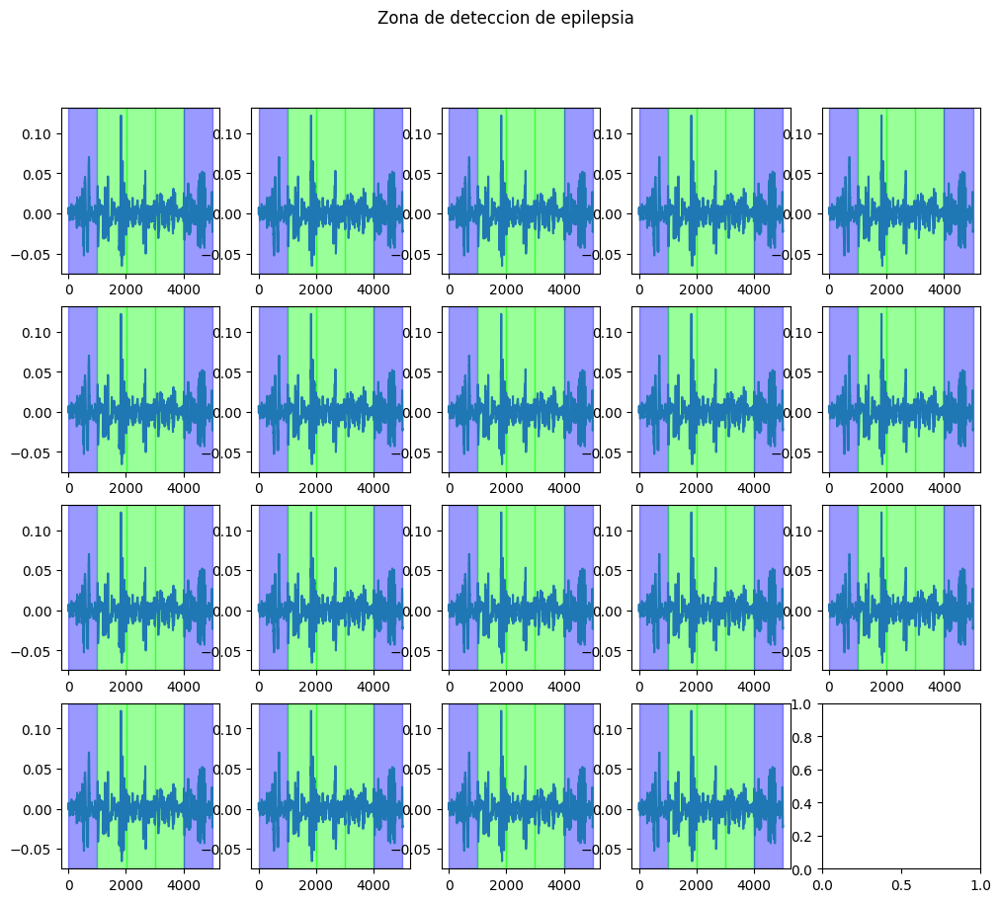

KeyboardInterrupt: 

In [ ]:
import mne
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
class EEG_CNN(nn.Module):
    def __init__(self, num_classes=4):
        super(EEG_CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=(3, 5), padding=(1, 2))
        self.conv2 = nn.Conv2d(32, 64, kernel_size=(3, 5), padding=(1, 2))
        self.conv3 = nn.Conv2d(64, 128, kernel_size=(3, 5), padding=(1, 2))
        self.pool = nn.MaxPool2d(kernel_size=(2, 2))

        self.flatten_size = 128 * 2 * 62
        self.fc1 = nn.Linear(self.flatten_size, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        x = torch.flatten(x, start_dim=1)
        #x = F.relu(self.fc1(x))
        #x = self.fc2(x)

        return x

def preprocess(path: str):
  channels_to_remove = ['EEG Cz-Ref', 'EEG Pz-Ref', 'ECG EKG', 'Manual']
  data = mne.io.read_raw_edf(path, preload=True)
  channels = data.ch_names
  indices_to_remove = [i for i, ch in enumerate(channels) if ch in channels_to_remove]
  raw_data = data.get_data()
  raw_data = np.array(raw_data)
  while raw_data.shape[0] >19 and len(indices_to_remove)>0:
    raw_data = np.delete(raw_data, indices_to_remove[-1], axis=0)
    indices_to_remove.pop()
  if raw_data.shape[0] >19:
    raw_data = raw_data[:19, :]
  elif raw_data.shape[0] <19:
    raw_data = np.vstack((raw_data, raw_data[:(19-len(raw_data.shape)[0]), :]))
  raw_data = np.array(raw_data)
  num_samples = raw_data.shape[1]
  print(num_samples)
  segment_size = 500
  N = num_samples // segment_size
  segmented_data = raw_data[:, :N * segment_size].reshape(N, 19, 500)
  for i in segmented_data:
    canal=[]
    for j in i:
      coeffs = pywt.dwt(j, 'db10')
      cA, cD = coeffs
      canal.append(cA)
    preproceso.append(canal)
  x_train=np.array(preproceso)

  tensor_data = torch.tensor(x_train, dtype=torch.float32)
  return tensor_data,x_train

def predecir(modelo, entrada):

    modelo.eval()
    with torch.no_grad():
        salida = modelo(entrada)
        prediccion = torch.argmax(salida, dim=1)
    return prediccion.item()

def iniciar(path: str):
  data,x_train=preprocess(path)
  modelo_cargado = torch.load("./modelo_EEG.pth")#path del modelo
  salida=[]
  for i in range(data.shape[0]):
    salida.append( predecir(modelo_cargado, data[i].unsqueeze(0).unsqueeze(0) ))


  if sum(salida)>0:
    mensaje = 'Se detecta epilepsia en EEG'
    for i in salida:
      if i !=0:
        canales = [list(x) for x in x_train[i - 2]]
        etiqueta=[]
        etiqueta.append(salida[i - 2])
        for pos in range(-1,3,1):
          registro =  x_train[i+pos]
          etiqueta.append(salida[i+pos])
          for posi,info in enumerate(registro):
            canales[posi].extend(info)
        fig, axs = plt.subplots(4, 5, figsize=(12, 10))
        plt.suptitle(f'Zona de deteccion de epilepsia')
        colores = ['#0000FF', '#00FF00', '#800080', '#00FFFF']
        for j,canal in enumerate(canales):
          row = j // 5
          col = j % 5
          axs[row, col].plot(graficas)

          seccion_size = len(graficas)//5
          for idx, label in enumerate(etiqueta):
            start = idx * seccion_size
            end = start + seccion_size
            color = colores[label % len(colores)]
            axs[row, col].axvspan(start, end, color=color, alpha=0.4)
        break
      else:
        continue

    plt.tight_layout()
    filename = f"GraficaAnalisis.webp"
    plt.savefig(filename, format='webp',dpi=300, bbox_inches='tight')
    plt.show()
    return mensaje
  else:
    mensaje = 'No se detecta epilepsia en EEG'
    return mensaje
men, output=iniciar('/content/Raw_EDF_Files/p10_Record1.edf')#path